# 👋 Machine Learning ft. Time Series Data

Welcome to the traditional machine learning ft. time series notebook! The key goal of this notebook is to work through a traditional machine learning workflow using **time series data**. We will also explore a few time series specific techniques, including engineering temporal-specific features and using the `prophet` library for forecasting. 

Where you see a 🛸 TASK in the tutorial, you will need to complete the task before moving on.

This tutorial relies heavily on a number of different resources mentioned below. Feel free to refer to some of these materials during the tutorial and in your project work:

**Repos**
- [Python tutorial on machine learning with time series for DSSGx 2020](https://github.com/mloning/intro-to-ml-with-time-series-DSSGx-2020) 

**Blogs**
- [Playing with Prophet on Bike Sharing Demand in Washington D.C](https://towardsdatascience.com/playing-with-prophet-on-bike-sharing-demand-time-series-1f14255f7ff0)
- [Hyperparameter tuning the random forest in Python](https://towardsdatascience.com/hyperparameter-tuning-the-random-forest-in-python-using-scikit-learn-28d2aa77dd74)

**Documentation**
- [Prophet: A forecasting procedure implemented in Python](https://facebook.github.io/prophet/)

In [1]:
from pathlib import Path
import os

#data vis imports 
import seaborn as sns
import matplotlib.pyplot as plt
import altair as alt

#data/data analysis analysis imports
import pandas as pd
import numpy as np

#timeseries imports
from statsmodels.tsa.stattools import adfuller
from prophet import Prophet

#ml imports
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import make_scorer

from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

#custom imports
from dap_taltech.utils.data_getters import DataGetter
import dap_taltech.utils.plotting as pl
import ts_utils as tsu

### Preamble

The code block below is the preamble to this tutorial so that:
- we install our dependencies;
- we load our time series dataset.
- print the docstring related to our dataset to get a better sense of it

In [2]:
os.system(
    f"pip install -r {Path.cwd()}/ts_requirements.txt --quiet" #install requirements to run this notebook
)

alt.data_transformers.disable_max_rows()

dg = DataGetter(local=False)
#load bike demand ts data
bike_df = dg.get_bike_demand()

2023-08-22 13:08:34,728 - TalTech HackWeek 2023 - INFO - Loading data from open dap-taltech s3 bucket. (data_getters.py:65)


In [3]:
help(bike_df) #Read the docstring for more info

Help on DataFrame in module pandas.core.frame object:

class DataFrame(pandas.core.generic.NDFrame, pandas.core.arraylike.OpsMixin)
 |  DataFrame(data=None, index: 'Axes | None' = None, columns: 'Axes | None' = None, dtype: 'Dtype | None' = None, copy: 'bool | None' = None) -> 'None'
 |  
 |  Two-dimensional, size-mutable, potentially heterogeneous tabular data.
 |  
 |  Data structure also contains labeled axes (rows and columns).
 |  Arithmetic operations align on both row and column labels. Can be
 |  thought of as a dict-like container for Series objects. The primary
 |  pandas data structure.
 |  
 |  Parameters
 |  ----------
 |  data : ndarray (structured or homogeneous), Iterable, dict, or DataFrame
 |      Dict can contain Series, arrays, constants, dataclass or list-like objects. If
 |      data is a dict, column order follows insertion-order. If a dict contains Series
 |      which have an index defined, it is aligned by its index. This alignment also
 |      occurs if data 

In [4]:
bike_df.head()

,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,2011-01-01,1,0,1,0,0,6,0,1,0.24,0.2879,0.81,0.0,3,13,16
1,2011-01-01,1,0,1,1,0,6,0,1,0.22,0.2727,0.80,0.0,8,32,40
2,2011-01-01,1,0,1,2,0,6,0,1,0.22,0.2727,0.80,0.0,5,27,32
3,2011-01-01,1,0,1,3,0,6,0,1,0.24,0.2879,0.75,0.0,3,10,13
4,2011-01-01,1,0,1,4,0,6,0,1,0.24,0.2879,0.75,0.0,0,1,1


🚲 The bike demand data contains helpful temporal and weather features, including (but not limited to):
- `dteday`: year-month-day (e.g. 2011-01-01) data
- `holiday`: binary indicator of whether the day is a holiday or not
- `weathersit`: categorical variable with 4 classes indicating the weather situation
- `cnt`: total number of bikes rented

This tutorial will use techniques to **predict/forecast the total number of bikes rented on an hourly basis (`cnt`).

We will work through the following steps: 

🖊️ **Data Exploration & Preparation:** Explore the features in the dataset, clean them and prepare the timeseries data for fitting models.

⚙️ **Feature Engineering:** Create new, relevant features from the existing features in the dataset.

📈 **Model Training & Evaluation:** Explore uni- and multivariate time series forecasting using the Facebook Prophet library. We will also train other regressor models (Decision tree, random forest, gradient boosting) and evaluate their performance on a test set.

🎼 **Hyperparameter Tuning:** Tune the hyperparameters (exploring both Grid Search and Randomised Search) of the best performing model. Evaluate the performance of the tuned model on a test set.

**NOTE:** Although we will be working through a forecasting problem and using a few techniques and python libraries unique to time series, the steps discussed in this tutorial can be used for any supervised machine learning problem.

### 🖊️ **Data Exploration & Preparation** 

Now that we've loaded the data and have a high level sense of the features, let's explore the data in more detail. 

In [5]:
print(f"The shape of the data is: {bike_df.shape}") #check the shape of the data
print('-------')
print(f"The number of duplicates is: {bike_df.duplicated().sum()}") #check for duplicates
print('-------')
print("The # of missing values across the different features:")
bike_df.isna().sum() #check for missing values

The shape of the data is: (17379, 16)
-------
The number of duplicates is: 0
-------
The # of missing values across the different features:


dteday        0
season        0
yr            0
mnth          0
hr            0
holiday       0
weekday       0
workingday    0
weathersit    0
temp          0
atemp         0
hum           0
windspeed     0
casual        0
registered    0
cnt           0
dtype: int64

In [6]:
bike_df.info() #check the data types

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17379 entries, 0 to 17378
Data columns (total 16 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   dteday      17379 non-null  object 
 1   season      17379 non-null  int64  
 2   yr          17379 non-null  int64  
 3   mnth        17379 non-null  int64  
 4   hr          17379 non-null  int64  
 5   holiday     17379 non-null  int64  
 6   weekday     17379 non-null  int64  
 7   workingday  17379 non-null  int64  
 8   weathersit  17379 non-null  int64  
 9   temp        17379 non-null  float64
 10  atemp       17379 non-null  float64
 11  hum         17379 non-null  float64
 12  windspeed   17379 non-null  float64
 13  casual      17379 non-null  int64  
 14  registered  17379 non-null  int64  
 15  cnt         17379 non-null  int64  
dtypes: float64(4), int64(11), object(1)
memory usage: 2.1+ MB


In [7]:
bike_df.iloc[:,1:].describe() #check the summary statistics

,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
count,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000
mean,2.501640,0.502561,6.537775,11.546752,0.028770,3.003683,0.682721,1.425283,0.496987,0.475775,0.627229,0.190098,35.676218,153.786869,189.463088
std,1.106918,0.500008,3.438776,6.914405,0.167165,2.005771,0.465431,0.639357,0.192556,0.171850,0.192930,0.122340,49.305030,151.357286,181.387599
min,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.020000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,2.000000,0.000000,4.000000,6.000000,0.000000,1.000000,0.000000,1.000000,0.340000,0.333300,0.480000,0.104500,4.000000,34.000000,40.000000
50%,3.000000,1.000000,7.000000,12.000000,0.000000,3.000000,1.000000,1.000000,0.500000,0.484800,0.630000,0.194000,17.000000,115.000000,142.000000
75%,3.000000,1.000000,10.000000,18.000000,0.000000,5.000000,1.000000,2.000000,0.660000,0.621200,0.780000,0.253700,48.000000,220.000000,281.000000
max,4.000000,1.000000,12.000000,23.000000,1.000000,6.000000,1.000000,4.000000,1.000000,1.000000,1.000000,0.850700,367.000000,886.000000,977.000000


Looks like the data is pretty clean. Lucky us! Let's move on to exploring the data in more detail.

In [8]:
#create long format of correlation matrix
corr_df = (bike_df
           .iloc[:,1:]
           .corr()
           .stack()
           .reset_index()
           .rename(columns={0:'correlation', 'level_0':'feature_1', 'level_1':'feature_2'})) 

corr_df['correlation_label'] = corr_df['correlation'].map('{:.2f}'.format)  # Round to 2 decimal

base = alt.Chart(corr_df).encode(
    x=alt.X('feature_1:O', title="Feature 1"),
    y=alt.Y('feature_2:O', title="Feature 2")   
)
# Text layer with correlation labels
# Colors are for easier readability
text = base.mark_text().encode(
    text='correlation_label',
    color=alt.condition(
        alt.datum.correlation > 0.5, 
        alt.value('white'),
        alt.value('black')
    )
)

# The correlation heatmap itself
cor_plot = base.mark_rect().encode(
    color='correlation:Q'
).properties(width=400, height=400)

pl.configure_plots(cor_plot + text, chart_title='Correlation Heatmap')

alt.LayerChart(...)

The correlation heatmap above shows the correlation between the different features in the dataset. We can see that the `cnt` feature is almost perfectly correlated with the `registered` feature. Next up, let's check out the distributions of a few continous features in the dataset.

In [10]:
#Let's check out the distributions of continuous features

#but first, let's convert the temperature features to celcius
bike_df = (bike_df
           .assign(temp=lambda x: x['temp'].apply(tsu.fahrenheit_to_celcius),
                   atemp=lambda x: x['atemp'].apply(tsu.fahrenheit_to_celcius)))

dist_features = ['temp', 'atemp', 'hum', 'windspeed', 'casual', 'registered', 'cnt']
dist_graphs = []
for feat in dist_features:
    dist_graph = alt.Chart(bike_df, title=f"{feat} distribution").mark_bar().encode(
    alt.X(f"{feat}:Q", bin=True),
    y='count()',
)
    dist_graphs.append(dist_graph)

dists = alt.vconcat(*dist_graphs[:3]) | alt.vconcat(*dist_graphs[4:]) 
pl.configure_plots(dists, chart_title='Distribution of continuous features')

alt.HConcatChart(...)

In addition to investigating distributions, let's investigate if the data is stationary. First, we will convert the date column to datetime and quickly plot daily bike demand to see if there are any obvious trends or seasonality.

In [13]:
#convert date column to datetime
bike_df = bike_df.assign(dteday = lambda x: pd.to_datetime(x.dteday))
#we can check that the data type has changed by:
print(f'The data type of the date column is now: {type(bike_df.dteday[0])}')
print('')
print(f"The date range is from {bike_df.dteday.min().date()} to {bike_df.dteday.max().date()}.") #check the date range

The data type of the date column is now: <class 'pandas._libs.tslibs.timestamps.Timestamp'>

The date range is from 2011-01-01 to 2012-12-31.


In [14]:
ts_day_df = (bike_df
             .groupby('dteday')
             .sum()
             ['cnt']
             .reset_index()
             .rename(columns={'cnt':'total_count'}))

#plot using altair
ts_day_plot = alt.Chart(ts_day_df).mark_line().encode(
    x=alt.X('dteday:T', title='Date'),
    y=alt.Y('total_count:Q', title='Count'),
    color=alt.value(pl.NESTA_COLOURS[1]),
    ).properties(width=1000, height=400)

pl.configure_plots(ts_day_plot, chart_title='Daily bike demand')

alt.Chart(...)

Now, let's run a Augmented Dickey-Fuller test to check if the data is stationary (which we explored in the previous `ts_methods` notebook).

In [15]:
# Checking for stationarity with Augmented Dickey-Fuller Test

result = adfuller(bike_df['cnt'])
print('ADF Statistic:', result[0])
print('p-value:', result[1])
print('Critical Values:')
for key, value in result[4].items():
    print('\t%s: %.3f' % (key, value))

ADF Statistic: -6.822918711895127
p-value: 1.9808626277974547e-09
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567


If the ADF statistic is more negative than the critical value, we can reject the null hypothesis that the data is non-stationary. 

🛸 TASK: Given the above results of the Augmented Dickey-Fuller Test and the plot of daily bike demand, is the data stationary? 

**Answer:** The data is/is not stationary because...

Let's also take a look at a few relevant cateogrical features in the dataset.

In [17]:
#to increase interpretability, lets create string versions of some 
# relevant categorical features then explore counts

season_dict = {1: 'spring', 2: 'summer', 3: 'fall', 4: 'winter'}
weathersit_dict = {1: 'clear', 2: 'mist', 3: 'light_rain', 4: 'heavy_rain'}
holiday_dict = {0: 'no_holiday', 1: 'holiday'}
workingday_dict = {0: 'no_workingday', 1: 'workingday'}

cat_features = ['season', 'weathersit', 'holiday', 'workingday']

cat_counts = []
for feat in cat_features:
    bike_df[f"{feat}_string"]  = bike_df[feat].map(eval(f"{feat}_dict"))
    cat_counts.append(alt.Chart(bike_df, title=f"{feat} distribution").mark_bar().encode(
        y=alt.Y(f"{feat}_string:N", title=f"{feat}"),
        x='count()'))

cat_dists = alt.vconcat(*cat_counts[:2]) | alt.vconcat(*cat_counts[2:]) 
pl.configure_plots(cat_dists, chart_title='Distribution of categorical features')

alt.HConcatChart(...)

Let's plot, plot, plot and see if we can find any interesting trends in the data.

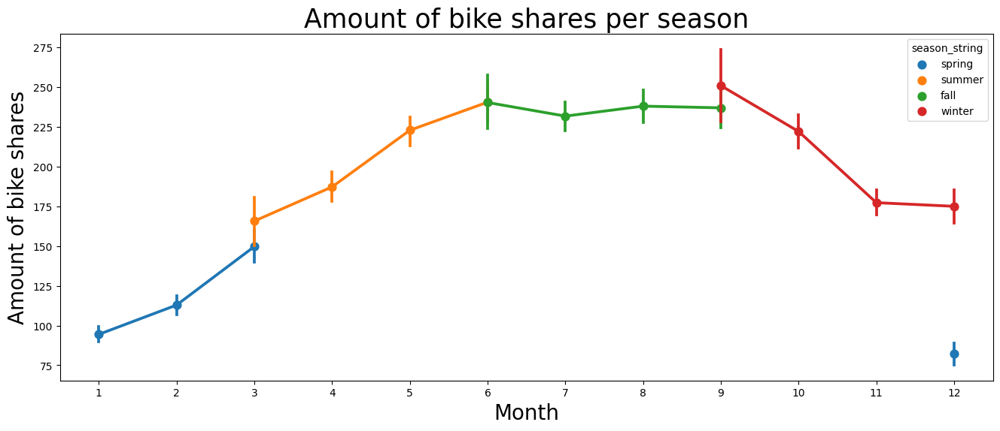

In [19]:
#let's also explore the average rental counts per season - not in altair this time
plt.figure(figsize=(16,6))
ax = sns.pointplot(data=bike_df,hue=bike_df.season_string,y=bike_df.cnt,x=bike_df.mnth)
ax.set_title("Amount of bike shares per season", fontsize=25)
ax.set_xlabel("Month", fontsize=20)
ax.set_ylabel('Amount of bike shares', fontsize=20)
plt.show()

In [20]:
weekday_df = (bike_df
              .iloc[:,1:]
              .groupby('weekday')
              .sum()
              ['cnt']
              .reset_index()
              .rename(columns={'cnt':'total_count'}))

weekday_dict = {0: 'Sunday', 1: 'Monday', 2: 'Tuesday', 3: 'Wednesday', 4: 'Thursday', 5:'Friday', 6:'Saturday'}
weekday_df['weekday_label'] = weekday_df['weekday'].map(weekday_dict)

weekday_gph = alt.Chart(weekday_df).mark_line().encode(
    x=alt.X('weekday_label', title='Day of the Week', axis=alt.Axis(labelAngle=-45)),
    y=alt.Y('total_count:Q', title='Count', scale=alt.Scale(zero=False))).properties(width=400, height=400)

             
pl.configure_plots(weekday_gph, chart_title='Bike demand by day of the week')

alt.Chart(...)

In [21]:
#plot bike shares by hour on a weekend vs. weekday to see if there are any differences

by_hour_weekend_df = (bike_df
                      .iloc[:,1:]
                      .query('workingday == 0')
                      .groupby(['weekday', 'hr'])
                      .sum()
                      ['cnt']
                      .reset_index()
                      .rename(columns={'cnt':'total_count'}))

hr_wknd_graph = alt.Chart(by_hour_weekend_df).mark_area().encode(
    x=alt.X('hr:Q', title='Hour of the day'),
    y=alt.Y('total_count:Q', title='Count'),
    color=alt.value(pl.NESTA_COLOURS[3])).properties(width=400, height=400)

hr_wknd_graph_configured = pl.configure_plots(hr_wknd_graph, chart_title='Bike demand by hour on a weekend')

hr_wknd_graph_configured

alt.Chart(...)

In [22]:
#what bokeshare per hour looklike on a weekday 
by_hour_weekday_df = (bike_df
                      .iloc[:,1:]
                      .query('workingday == 1')
                      .groupby(['weekday', 'hr'])
                      .sum()
                      ['cnt']
                      .reset_index()
                      .rename(columns={'cnt':'total_count'}))

hr_wkday_graph = alt.Chart(by_hour_weekday_df).mark_area().encode(
    x=alt.X('hr:Q', title='Hour of the day'),
    y=alt.Y('total_count:Q', title='Count'),
    color=alt.value(pl.NESTA_COLOURS[4])).properties(width=400, height=400)

hr_wkday_graph_configured = pl.configure_plots(hr_wkday_graph, chart_title='Bike demand by hour on a weekday')

hr_wkday_graph_configured

alt.Chart(...)

In [23]:
#compare the two graphs

pl.configure_plots(hr_wknd_graph + hr_wkday_graph, 
                   chart_title='Bike demand by hour on a weekday vs. weekend',
                   chart_subtitle=['Where weekday is in red and weekend is in purple'])

alt.LayerChart(...)

**🛸 TASK:** Spend some time writing out interpretations of the exploration. What do you notice about the data? 

**🏷️ ANSWER:** Based on the graphs and values above, we can see that...

**🛸 TASK:** Once you've done that, think about how else you can explore the data. What else would you like to know?

In [24]:
#Additional data exploration here...

🎉 Great! Now that we have a better sense of the features incl. their data types, distributions, correlations and missing values, let's investigate feature engineering.

### ⚙️ **Feature Engineering**


Given the exploration of the data, we can see that the data is relatively complete and clean. However, we may want to create additional features. Let's create the following:

- `dtetime`: a datetime object that combines the `dteday` and `hr` columns in order to predict hourly bike demand.

We could also create additional temporal features from the `dtetime` column like:

- `temp_rolling_mean`: the rolling mean of the temperature over the past 24 hours

In [25]:
#lets combine the dteday and hr columns to create a datetime column
bike_df = bike_df.assign(datetime=lambda x: x.dteday + pd.to_timedelta(x.hr, unit='h'))

#let's also drop the string columns (used to make plots more interpretable)
cols_to_drop = [col for col in bike_df.columns if '_string' in col]
bike_df.drop(columns=cols_to_drop, inplace=True)

In [26]:
#Now that we've created that feature, lets set it as the index
bike_df.set_index('datetime', inplace=True)
#finally, let's create a rolling mean of the temperature
bike_df['temp_rolling_mean'] = bike_df.temp.rolling(24).mean()

In [27]:
#Now that we've added the aditional features, let's plot them 

rolling_mean_df = (bike_df
                   .reset_index()
                   [['datetime', 'temp_rolling_mean']]
                   .dropna())

#plot temperature rolling mean in altair
rolling_mean_graph = alt.Chart(rolling_mean_df).mark_line().encode(
    x=alt.X('datetime:T', title='Date'),
    y=alt.Y('temp_rolling_mean:Q', title='Temperature (C) rolling mean'),
    color=alt.value(pl.NESTA_COLOURS[0])
    ).properties(width=600, height=400)

pl.configure_plots(rolling_mean_graph, chart_title='Temperature rolling mean')

alt.Chart(...)

🛸 TASK: Are there other features you think would be useful to create to predict hourly bike demand? 

Explore and plot temporal features like lagged values, additional rolling means, etc. 

In [28]:
#Create additional features

### 📈 **Model Training**

Now that we've created a few new features, let's explore two different methods of fitting a model to predict hourly bike demand. In the first instance, we will use facebook's `prophet` library, a time series forecasting library, to fit a model. In the second instance, we will use `scikit learn's` to fit and evaluate different models. 


#### 🧙 `prophet`

Let's take a quick detour to learn more about the `prophet` library.

Prophet is a procedure for forecasting time series data based on an additive model where non-linear trends are fit with yearly, weekly, and daily seasonality, plus holiday effects. It works best with time series that have strong seasonal effects and several seasons of historical data. Prophet is robust to missing data and shifts in the trend, and typically handles outliers well.


Let's use it to fit a model to our data and predict future values in a univariate setting (i.e. using only the target variable to predict future values).

In [29]:
m = Prophet()

uni_data = bike_df.reset_index()[['datetime', 'cnt']].rename(columns={'datetime': 'ds', 'cnt': 'y'})
#in a univariate setting, we can just use the date and target variable
m.fit(uni_data)

future = m.make_future_dataframe(periods=365, freq='H') # set the frequency to hourly
future_df = m.predict(future)

13:16:26 - cmdstanpy - INFO - Chain [1] start processing
13:16:28 - cmdstanpy - INFO - Chain [1] done processing


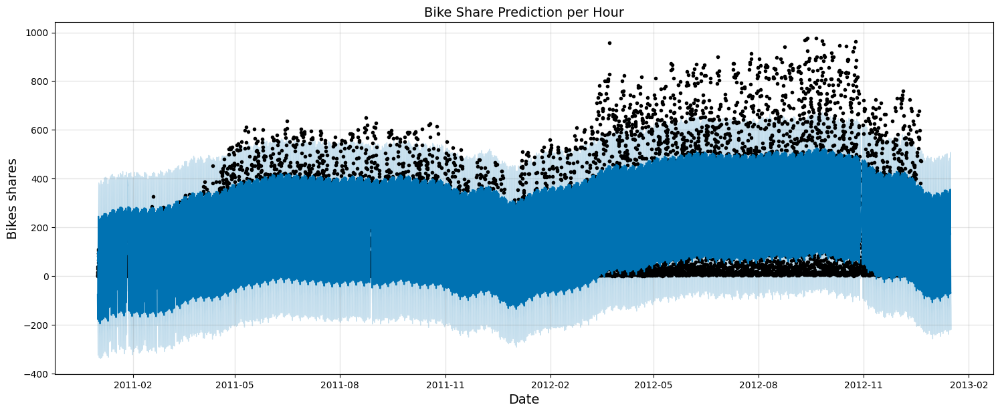

In [30]:
# Plot the day forecast - not in altair
f, ax = plt.subplots(1)
f.set_figheight(6)
f.set_figwidth(15)

m.plot(future_df, ax=ax)

ax.set_title('Bike Share Prediction per Hour', fontsize=14)
ax.set_xlabel(xlabel='Date', fontsize=14)
ax.set_ylabel(ylabel='Bikes shares', fontsize=14)

plt.show()


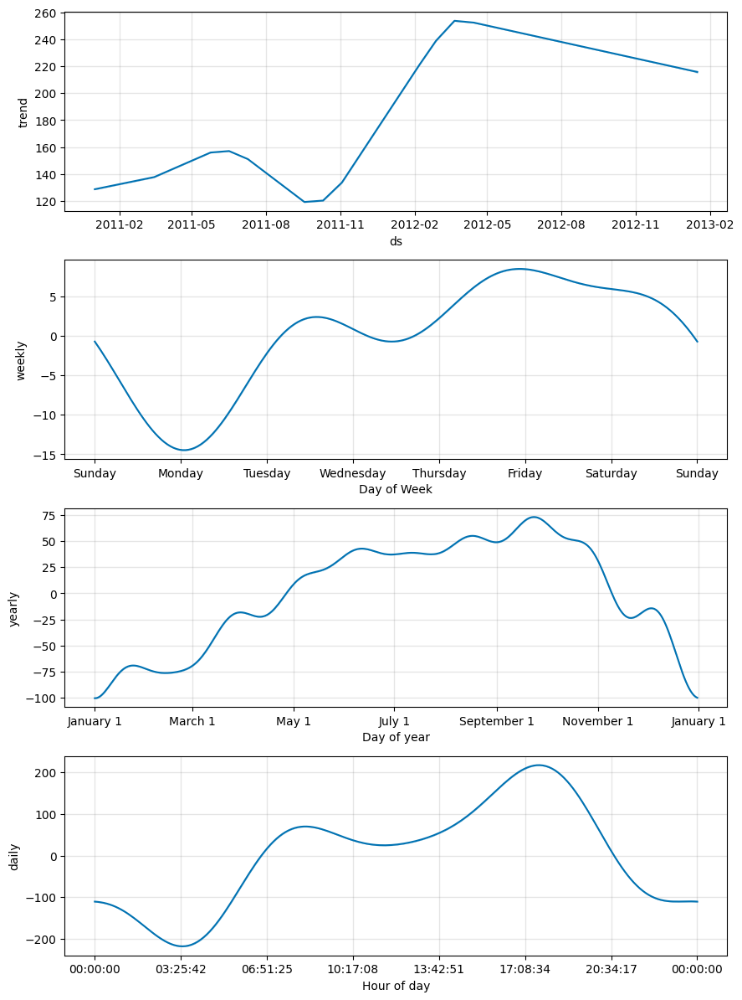

In [31]:
#plot forecasts for each forecast component - not in altair
fig2 = m.plot_components(future_df)

#### 🍏 `scikit-learn`

`scikit-learn` is a popular machine learning library for Python. It provides a range of supervised and unsupervised learning algorithms via a consistent interface in Python. We will be training and evaluating the following models:

1. **Decision Tree Regressor:** a non-parametric supervised learning method used for regression. The goal is to create a model that predicts the value of a target variable by learning simple decision rules inferred from the data features.

2. **Random Forest Regressor:** a bagging ensemble method that trains a number of decision trees on random subsets of the data and uses averaging to improve the predictive accuracy and control over-fitting.

3. **Gradient Boosting Regressor:** a boosting ensemble method that trains a number of decision trees sequentially, where each tree is trained to correct the mistakes of the previous one.

Before we begin fitting the models, we will refine the features we want to use to train the models. 

We will also need to split the data into training and test sets. Let's set `shuffle=false` in scikit learn's `train_test_split` to ensure temporal order. 

In [32]:
#Let's remove string columns, dteday, and variables that are almost perfectly correlated to the target variable
#that we saw in the correlation heatmap. This is `registed`.
bike_df = (bike_df
           .drop(columns=['dteday', 
                          'registered'])
           #drop rows that contain na 
           .dropna())
bike_df.sort_index(inplace=True) # sort the index 

#lets split the data into train and test sets
X = bike_df.drop(columns='cnt') #these are our features 
y = bike_df['cnt'] #this is our target variable

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1, shuffle=False) #set shuffle to false to retain temporal order

**🛸 TASK:** Read into scikit-learn's documentation on [`Time Series Split`](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.TimeSeriesSplit.html). What is the purpose of it? 

**🏷️ ANSWER:** ...

Now that we've done that, let's define an evaluation function that will help us evaluate the performance of the models on the validation set. In this example, we will use the **Root Mean Squared Error (RMSE)** as our evaluation metric. 

**RMSE** refers to the square root of the mean of the squared errors. It is a popular metric because it penalizes large errors more heavily than small errors in the dataset. The lower the RMSE value, the better the model's predictions align with the actual target values.

In [33]:
#Let's define the models we're going to use via sci-kit learn
models = {
    'Decision Tree': DecisionTreeRegressor(),
    'Random Forest': RandomForestRegressor(),
    'Gradient Boosting': GradientBoostingRegressor(),
}

#Let's define our scorer
rmse_scorer = make_scorer(tsu.root_mean_squared_error)

In [35]:
#Train models and evaluate via cross-validation 
for model_name, model in models.items():
    cv_scores = cross_val_score(model, X_train, y_train, scoring=rmse_scorer, cv=5) #cv is the number of folds for k-fold cross validation 
    print(f"Model: {model_name}")
    print(f"Average RMSE: {np.mean(cv_scores)}\n")

Model: Decision Tree
Average RMSE: 65.70224434616092

Model: Random Forest
Average RMSE: 52.0990811725512

Model: Gradient Boosting
Average RMSE: 54.99322067389369



Based off of the average RMSE values, we can see that the Random Forest model performs the best on the test set. Let's evaluate the performance of the Random Forest model on the test set.

In [36]:
# Fit and evaluate the best model on the test set
model = RandomForestRegressor()  
model.fit(X_train, y_train)

y_pred = model.predict(X_test)
test_rmse = tsu.root_mean_squared_error(y_test, y_pred)
print(f"Test RMSE for the best model: {test_rmse}")

Test RMSE for the best model: 61.98935461697834


Let's explore feature importance in the Random Forest model to see which features are most important in predicting hourly bike demand.

In [37]:
# get importance
importance = model.feature_importances_
features = list(X_train.columns)

#Lets plot the feature importances using altair
importance_df = pd.DataFrame({'feature': features, 'importance': importance})

feature_importance_graph = alt.Chart(importance_df).mark_bar().encode(
    x=alt.X('importance:Q', title='Importance'),
    y=alt.Y('feature:N', title='Feature', sort='-x'))

pl.configure_plots(feature_importance_graph, chart_title='Feature importance')

alt.Chart(...)

🛸 **TASK:** What are the most important features in predicting bike demand? Are there any additional feature engineering we can do to improve the model's performance? Feel free to experiment. 

**🏷️ ANSWER:** The most important features in predicting bike demand are...

### 🎼 **Hyperparameter Tuning**

Now that we have selected the best performing model, let's tune the hyperparameters of the model to see if we can improve its performance. We will explore **two** different hyperparameter tuning methods:

1. **Grid Search:** an exhaustive search over specified parameter values for an estimator.
2. **Random Search:** a randomized search over specified parameter values for an estimator.

Let's first explore the possible parameters to tune.

In [38]:
# Look at parameters used by our current forest
print('Parameters currently in use:\n')
print(model.get_params())

Parameters currently in use:

{'bootstrap': True, 'ccp_alpha': 0.0, 'criterion': 'squared_error', 'max_depth': None, 'max_features': 1.0, 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 100, 'n_jobs': None, 'oob_score': False, 'random_state': None, 'verbose': 0, 'warm_start': False}


Looks like there are a ton! 

Let's consult [sci-kit learn's documentation](https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html) for the Random Forest model to learn more about the parameters and their default values. This tells us the most important settings are the number of trees in the forest (n_estimators) and the number of features considered for splitting at each leaf node (max_features).

To use RandomizedSearchCV or GridSearchCV, we first need to create a parameter grid to sample from during fitting. 

Let's do this first for the RandomizedSearchCV method.

In [39]:
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Number of features to consider at every split
max_features = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]

# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features}

print('our random grid is:')
print(random_grid)

our random grid is:
{'n_estimators': [200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000], 'max_features': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]}


Now, we instantiate the random search and fit it. 

**NOTE:** This will take a few minutes to run. 

In [40]:
# Use the random grid to search for best hyperparameters
# First create the base model to tune
rf = RandomForestRegressor()
# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, n_iter = 50, cv = 3, verbose=2, random_state=42, n_jobs = -1)
# Fit the random search model
rf_random.fit(X_train, y_train)

Fitting 3 folds for each of 50 candidates, totalling 150 fits
[CV] END ...................max_features=8, n_estimators=200; total time=   6.5s
[CV] END ...................max_features=8, n_estimators=200; total time=   6.6s
[CV] END ...................max_features=8, n_estimators=200; total time=   6.7s
[CV] END ...................max_features=6, n_estimators=800; total time=  22.2s
[CV] END ...................max_features=6, n_estimators=800; total time=  22.6s
[CV] END ...................max_features=6, n_estimators=800; total time=  23.4s
[CV] END ...................max_features=9, n_estimators=800; total time=  31.3s
[CV] END ...................max_features=9, n_estimators=800; total time=  31.9s
[CV] END ...................max_features=9, n_estimators=800; total time=  31.8s
[CV] END ..................max_features=5, n_estimators=1200; total time=  32.1s


/Users/india.kerlenesta/opt/anaconda3/envs/dap_taltech/lib/python3.9/site-packages/joblib/externals/loky/process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[CV] END ..................max_features=5, n_estimators=1200; total time=  32.1s
[CV] END ..................max_features=5, n_estimators=1000; total time=  28.0s
[CV] END ..................max_features=5, n_estimators=1000; total time=  27.5s
[CV] END ..................max_features=5, n_estimators=1200; total time=  32.8s
[CV] END ..................max_features=5, n_estimators=1000; total time=  26.9s
[CV] END ...................max_features=3, n_estimators=600; total time=  11.6s
[CV] END ...................max_features=3, n_estimators=600; total time=  11.9s
[CV] END ...................max_features=3, n_estimators=600; total time=  12.0s
[CV] END ...................max_features=9, n_estimators=200; total time=   9.1s
[CV] END ...................max_features=2, n_estimators=200; total time=   3.5s
[CV] END ...................max_features=2, n_estimators=200; total time=   3.4s
[CV] END ...................max_features=9, n_estimators=200; total time=   9.0s
[CV] END ...................

RandomizedSearchCV(cv=3, estimator=RandomForestRegressor(), n_iter=50,
                   n_jobs=-1,
                   param_distributions={'max_features': [1, 2, 3, 4, 5, 6, 7, 8,
                                                         9, 10],
                                        'n_estimators': [200, 400, 600, 800,
                                                         1000, 1200, 1400, 1600,
                                                         1800, 2000]},
                   random_state=42, verbose=2)

Random search allowed us to narrow down the range for each hyperparameter. Now that we know where to concentrate our search, we can explicitly specify every combination of settings to try. We do this with GridSearchCV, a method that, instead of sampling randomly from a distribution, evaluates all combinations we define. 

To use Grid Search, we define another grid based on the best values provided by random search.

In [42]:
# Create the parameter grid based on the results of random search - this is a more focused search

print('The best parameters are:')
print(rf_random.best_params_)

param_grid = {
    'n_estimators': [1300, 1600, 1800],
    'max_features': [8, 9, 10]
}

print('our parameter grid is:')
print(param_grid)

The best parameters are:
{'n_estimators': 1800, 'max_features': 9}
our parameter grid is:
{'n_estimators': [1300, 1600, 1800], 'max_features': [8, 9, 10]}


Now that we've defined the grid search, let's re-fit the model as before. Let's also evaluate the tuned model on the test set.

In [43]:
# Create a based model
rf = RandomForestRegressor()
# Instantiate the grid search model
grid_search = GridSearchCV(estimator = rf, param_grid = param_grid, 
                          cv = 3, n_jobs = -1, verbose = 2)
# Fit the grid search to the data
grid_search.fit(X_train, y_train)
print(grid_search.best_params_)
best_grid = grid_search.best_estimator_

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV] END ..................max_features=8, n_estimators=1300; total time=  51.7s
[CV] END ..................max_features=8, n_estimators=1300; total time=  52.3s
[CV] END ..................max_features=8, n_estimators=1300; total time=  53.5s
[CV] END ..................max_features=8, n_estimators=1600; total time= 1.1min


/Users/india.kerlenesta/opt/anaconda3/envs/dap_taltech/lib/python3.9/site-packages/joblib/externals/loky/process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[CV] END ..................max_features=8, n_estimators=1600; total time= 1.1min
[CV] END ..................max_features=8, n_estimators=1600; total time= 1.1min
[CV] END ..................max_features=8, n_estimators=1800; total time= 1.2min
[CV] END ..................max_features=8, n_estimators=1800; total time= 1.2min
[CV] END ..................max_features=9, n_estimators=1300; total time=  55.9s
[CV] END ..................max_features=9, n_estimators=1300; total time=  57.4s
[CV] END ..................max_features=8, n_estimators=1800; total time= 1.1min
[CV] END ..................max_features=9, n_estimators=1300; total time=  55.7s
[CV] END ..................max_features=9, n_estimators=1600; total time= 1.1min
[CV] END ..................max_features=9, n_estimators=1600; total time= 1.1min
[CV] END ..................max_features=9, n_estimators=1600; total time= 1.1min
[CV] END ..................max_features=9, n_estimators=1800; total time= 1.3min
[CV] END .................ma

In [44]:
#Let's fit the best model on the training set
best_grid.fit(X_train, y_train)
#pred on test set
y_pred = best_grid.predict(X_test)
rmse_tuned = tsu.root_mean_squared_error(y_test, y_pred)
print(f"Test RMSE for the best model: {rmse_tuned}.") 
print(f"The percent change in RMSE is {tsu.percent_change(rmse_tuned, test_rmse)}%.")

Test RMSE for the best model: 62.00101621580533.
The percent change in RMSE is 0.02%.


🛸 **TASK:** How do you interpret the results? What do you think we need to do to improve the tuned model?

**🏷️ ANSWER:** ...

### 🚲 Forecasting bike demand: Wrapping up

This notebook covered the following steps in the machine learning pipeline:

🖊️ **Data Exploration & Preparation:** Explore the features in the dataset, clean them and prepare the timeseries data for a supervised machine learning problem.

⚙️ **Feature Engineering:** Create new, relevant features from the existing features in the dataset.

📈 **Model Training & Evaluation:** Train several different models and evaluate their performance on a test set.

🎼 **Hyperparameter Tuning:** Tune the hyperparameters using Randomised and Grid Search of the best performing model. Evaluate the performance of the tuned model on a test set.

🍬 Given our trained model, let's explore the actual vs. predicted `cnt` values in the test set.

In [45]:
#prepare df for altair graphs
pred_df = (y_test
 .reset_index()
 .rename(columns={'cnt': 'actual'})
 .assign(predicted=y_pred))

#make pred_df a long df for altair
pred_df_long = pred_df.melt(id_vars='datetime', value_vars=['actual', 'predicted'])

#actual vs. predicted graph

act_pred_graph = alt.Chart(pred_df_long).mark_line().encode(
    x=alt.X('datetime:T', title='Date'),
    y=alt.Y('value:Q', title='Bike Rentals'),
    color=alt.Color('variable:N', title=None)).properties(width=600, height=400)

train_df_long = (y_train
 .reset_index()
 .rename(columns={'cnt': 'actual'})
 .melt(id_vars='datetime', value_vars=['actual']))

forecast_df = pd.concat([train_df_long, pred_df_long])

forecast_graph = alt.Chart(forecast_df).mark_line().encode(
    x=alt.X('datetime:T', title='Date'),
    y=alt.Y('value:Q', title='# of Bike Rentals'),
    color=alt.Color('variable:N', title=None)).properties(width=600, height=400)
    

In [53]:
pl.configure_plots(forecast_graph | act_pred_graph, 
                   chart_title='Actual vs. Predicted Hourly Bike Rentals',
                   chart_subtitle=['Although the model captures the general trend, it does not capture the peaks and valleys.'])

alt.HConcatChart(...)

**🛸 TASK:** Can you investigate weekly and daily trends?